# OPTIMIZACIÓN DE MECANISMO 4 BARRAS EN FUNCIÓN DE TRAYECTORIA

## Descripción del mecanismo

El mecanismo de 4 barras tiene:
- **Barra 1 (manivela):** O → A, longitud L1, ángulo θ (entrada)
- **Barra 2 (acoplador):** A → B, longitud L2, ángulo θ+β₁
- **Barra 3 (seguidor):** B → C, longitud L3, ángulo θ+β₁+β₂
- **Barra fija (tierra):** L4x, L4y (vector de C a O en marco N)
- **Punto de interés S:** sobre la barra acopladora AB, desplazado L5t (tangencial) y L5n (normal)

**Convención de signos:** O en el origen. C está en posición `(-L4x, -L4y)` relativa a O.

### Librerías

In [260]:
import numpy as np
from numpy import deg2rad, rad2deg
import matplotlib.pyplot as plt
from sympy.physics.mechanics import dynamicsymbols, ReferenceFrame, init_vprinting
from scipy.optimize import fsolve, minimize, differential_evolution
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

## Cinemática del mecanismo

La ecuación de cierre cinemático es:

$$\vec{r}_1 + \vec{r}_2 + \vec{r}_3 + \vec{r}_4 = 0$$

donde $\vec{r}_4 = L_{4x}\hat{N}_x + L_{4y}\hat{N}_y$ es el vector fijo de C a O.

En componentes:
$$L_1\cos\theta + L_2\cos(\theta+\beta_1) + L_3\cos(\theta+\beta_1+\beta_2) + L_{4x} = 0$$
$$L_1\sin\theta + L_2\sin(\theta+\beta_1) + L_3\sin(\theta+\beta_1+\beta_2) + L_{4y} = 0$$

In [261]:
# ============================================================
# PARÁMETROS DEL PUNTO DE INTERÉS S (fijos durante optimización)
# ============================================================
# S está sobre la barra acopladora AB:
#   L5t: desplazamiento tangencial (a lo largo de AB)
#   L5n: desplazamiento normal (perpendicular a AB, positivo hacia la izquierda)
from sympy.core import symbols


L5t = 0.05   # metros
L5n = -0.05  # metros

L1,L2,L3 = symbols('L1 L2 L3')
L4x, L4y = symbols('L4x L4y')
L5_tangent, L5_normal = symbols('L5_t L5_n')
theta, beta1, beta2 = dynamicsymbols('theta beta_1 beta_2')

#Marcos de referencia
N = ReferenceFrame('N')
A = N.orientnew('A', 'Axis', [theta, N.z])
B = A.orientnew('B', 'Axis', [beta1, A.z])
C = B.orientnew('C', 'Axis', [beta2, B.z])

r1 = L1 * A.x
r2 = L2 * B.x
r3 = L3 * C.x
r4 = L4x * N.x + L4y * N.y
r5 = L5_tangent * B.x + L5_normal * B.y
kinematic_loop = r1 + r2 + r3 + r4 #= 0

S_position = r1 + r5  # posición de S en términos de los marcos y parámetros

# ============================================================
# FUNCIONES CINEMÁTICAS
# ============================================================

def kinematic_eqs(b1, b2, th, l1, l2, l3, l4x, l4y):
    """
    Ecuaciones de cierre cinemático para mecanismo de 4 barras.
    
    Parámetros
    ----------
    beta1, beta2 : float  - ángulos relativos β₁ y β₂ (rad)
    theta  : float  - ángulo de la manivela θ (rad)
    L1..L4y: float  - dimensiones del mecanismo (m)
    
    Retorna
    -------
    list[float, float] : residuales de las ecuaciones de cierre
    """
    parameters = {beta1: b1, beta2: b2, theta: th, L1: l1, L2: l2, L3: l3, L4x: l4x, L4y: l4y}
    eq1 = kinematic_loop.dot(N.x).subs(parameters)
    eq2 = kinematic_loop.dot(N.y).subs(parameters)
    # eq1 = l1*np.cos(th) + l2*np.cos(th+b1) + l3*np.cos(th+b1+b2) + l4x
    # eq2 = l1*np.sin(th) + l2*np.sin(th+b1) + l3*np.sin(th+b1+b2) + l4y
    return [eq1, eq2]


def FK(theta1, z0, L1, L2, L3, L4x, L4y):
    """
    Cinemática Directa (Forward Kinematics).
    Dado theta, resuelve para [beta1, beta2].
    
    Parámetros
    ----------
    theta1 : float  - ángulo de entrada de la manivela (rad)
    z0     : array  - estimación inicial [beta1, beta2] (rad)
    L1..L4y: float  - dimensiones del mecanismo (m)
    
    Retorna
    -------
    sol      : array [beta1, beta2] solución
    residual : float norma del residual (0 = convergió perfectamente)
    """
    fun = lambda x: kinematic_eqs(x[0], x[1], theta1, L1, L2, L3, L4x, L4y)
    sol, info, ier, _ = fsolve(fun, z0, xtol=1e-10, full_output=True)
    residual = float(np.linalg.norm(info['fvec']))
    return sol, residual


def point_S(th1, b1, l1, l5t=L5t, l5n=L5n):
    """
    Posición del punto de interés S sobre la barra acopladora.
    
    S = O + r1 + L5t*(dirección AB) + L5n*(normal a AB)
    """
    parameters = {beta1: b1, theta: th1, L1: l1, L5_tangent: l5t, L5_normal: l5n}
    S = S_position
    Sx = S.dot(N.x).subs(parameters)
    Sy = S.dot(N.y).subs(parameters)

    # theta12 = th1 + b1
    # Sx = l1*np.cos(th1) + l5t*np.cos(theta12) - l5n*np.sin(theta12)
    # Sy = l1*np.sin(th1) + l5t*np.sin(theta12) + l5n*np.cos(theta12)
    return np.array([Sx, Sy])


def compute_positions(th1, b1, b2, l1, l2, l3):
    """
    Calcula las posiciones cartesianas de todos los puntos del mecanismo.
    
    Retorna
    -------
    PO, PA, PB, PC, PS : arrays [x,y] de cada punto
    """
    parameters = {beta1: b1, beta2: b2, theta: th1, L1: l1, L2: l2, L3: l3}

    PO = np.array([0.0, 0.0])
    PA = PO + np.array([r1.dot(N.x).subs(parameters), r1.dot(N.y).subs(parameters)])
    PB = PA + np.array([r2.dot(N.x).subs(parameters), r2.dot(N.y).subs(parameters)])
    PC = PB + np.array([r3.dot(N.x).subs(parameters), r3.dot(N.y).subs(parameters)])
    PSx, PSy = point_S(th1, b1, l1)
    PS = np.array([PSx.subs(parameters), PSy.subs(parameters)])

    # PO = np.array([0.0, 0.0])
    # PA = PO + l1 * np.array([np.cos(th1), np.sin(th1)])
    # PB = PA + l2 * np.array([np.cos(th1+b1), np.sin(th1+b1)])
    # PC = PB + l3 * np.array([np.cos(th1+b1+b2), np.sin(th1+b1+b2)])
    # PS = point_S(th1, b1, l1)

    return PO, PA, PB, PC, PS


def simulate_mechanism(l1, l2, l3, l4x, l4y, angle_list, z0_init=None):
    """
    Simula el mecanismo para una lista de ángulos de entrada.
    Usa continuación (warm-start) entre pasos para robustez.
    
    Retorna
    -------
    angle_list : array (N, 3) con [theta1, beta1, beta2]
    S_traj      : array (N, 2) con posición de S en cada paso
    converged   : array (N,) bool - True si FK convergió
    """
    if z0_init is None:
        z0_init = [deg2rad(120), deg2rad(-80)]
    
    N = len(angle_list)
    angles_list = np.zeros((N, 3))
    S_traj = np.zeros((N, 2))
    converged = np.zeros(N, dtype=bool)
    
    z0 = z0_init.copy() if hasattr(z0_init, 'copy') else list(z0_init)
    
    for i, theta1 in enumerate(angle_list):
        z, res = FK(theta1, z0, l1, l2, l3, l4x, l4y)
        if res < 1e-6:
            z0 = z.tolist()  # continuación: usa la solución anterior como nueva estimación
            converged[i] = True
        else:
            converged[i] = False
        
        angles_list[i] = [theta1, z[0], z[1]]
        S_traj[i] = point_S(theta1, z[0], l1)
    
    return angles_list, S_traj, converged


print("Funciones cinemáticas definidas correctamente.")

Funciones cinemáticas definidas correctamente.


In [262]:
FK(0.1, [0.5, 0.5], 0.080, 0.240, 0.2, 0.19, 0.07)

(array([-28.86643514,  64.60011497]), 6.374798347921584e-14)

In [263]:
point_S(0.1, 0.5, 0.080)

array([0.149099237637478, -0.00504798374398589], dtype=object)

In [264]:
compute_positions(0.1, 0.5, 0.5, 0.080, 0.240, 0.2)

(array([0., 0.]),
 array([0.0796003332222421, 0.00798667333174625], dtype=object),
 array([0.277680880800565, 0.143500866946555], dtype=object),
 array([0.368400105085680, 0.321742338958842], dtype=object),
 array([0.149099237637478, -0.00504798374398589], dtype=object))

## Verificación cinemática con dimensiones de referencia

Usando las dimensiones de la imagen: OA=80mm, AB=240mm, BC=200mm, OC=(190mm, 70mm)

In [265]:
# Dimensiones de referencia (en metros)
L1_ref, L2_ref, L3_ref = 0.080, 0.240, 0.200
# C está a (-190mm, -70mm) de O, entonces el vector CO = r4 = (190, 70)mm
L4x_ref, L4y_ref = 0.190, 0.070

# Verificar que PC ≈ posición de C = (-L4x, -L4y)
theta_test = deg2rad(30)
z0_test = [deg2rad(150), deg2rad(-100)]
z_test, res_test = FK(theta_test, z0_test, L1_ref, L2_ref, L3_ref, L4x_ref, L4y_ref)
PO, PA, PB, PC, PS = compute_positions(theta_test, z_test[0], z_test[1],
                                         L1_ref, L2_ref, L3_ref)

print(f"theta = {rad2deg(theta_test):.1f}°")
print(f"beta1 = {rad2deg(z_test[0]):.2f}°, beta2 = {rad2deg(z_test[1]):.2f}°")
print(f"Residual FK: {res_test:.2e}")
print(f"\nPosiciones (mm):")
print(f"  O  = ({PO[0]*1000:.1f}, {PO[1]*1000:.1f})")
print(f"  A  = ({PA[0]*1000:.1f}, {PA[1]*1000:.1f})")
print(f"  B  = ({PB[0]*1000:.1f}, {PB[1]*1000:.1f})")
print(f"  C  = ({PC[0]*1000:.1f}, {PC[1]*1000:.1f})  [debería ser (-190, -70)]")
print(f"  S  = ({PS[0]*1000:.1f}, {PS[1]*1000:.1f})")

theta = 30.0°
beta1 = 217.19°, beta2 = -100.97°
Residual FK: 5.55e-17

Posiciones (mm):
  O  = (0.0, 0.0)
  A  = (69.3, 40.0)
  B  = (-23.8, -181.2)
  C  = (-190.0, -70.0)  [debería ser (-190, -70)]
  S  = (3.8, 13.3)


## Trayectoria deseada

Define aquí los puntos objetivo que el punto S debe seguir.
Cada fila es un punto `[x, y]` en metros.

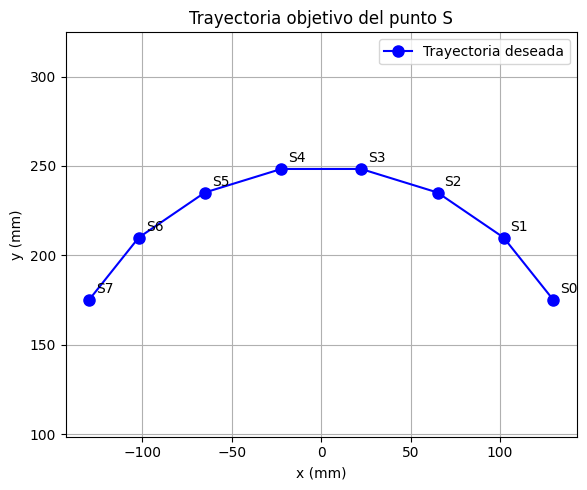

Número de puntos objetivo: 8


In [ ]:
# ============================================================
# TRAYECTORIA DESEADA
# ============================================================
# Ejemplo 1: Línea horizontal
# SList = np.array([
#     [ 0.15,  0.20],
#     [ 0.10,  0.20],
#     [ 0.05,  0.20],
#     [ 0.00,  0.20],
#     [-0.05,  0.20],
#     [-0.10,  0.20],
# ])

# Ejemplo 2: Arco de círculo
angles_arc = np.linspace(deg2rad(30), deg2rad(150), 8)
R_arc = 0.15
SList = np.column_stack([R_arc * np.cos(angles_arc), R_arc * np.sin(angles_arc) + 0.10])

# Ejemplo 3: Línea inclinada
# SList = np.array([
#     [0.10, 0.10],
#     [0.05, 0.13],
#     [0.00, 0.16],
#     [-0.05, 0.19],
#     [-0.10, 0.22],
# ])

# El ángulo theta1 se distribuye uniformemente para los N puntos objetivo
"""LISTA DE ITERACIÓN PARA THETA1"""
theta_opt_list = np.linspace(0, 2*np.pi, len(SList), endpoint=False)

# Visualizar trayectoria deseada
plt.figure(figsize=(6, 5))
plt.plot(SList[:, 0]*1000, SList[:, 1]*1000, 'bo-', markersize=8, label='Trayectoria deseada')
for i, (x, y) in enumerate(SList):
    plt.annotate(f'S{i}', (x*1000, y*1000), textcoords='offset points', xytext=(5, 5))
plt.xlabel('x (mm)')
plt.ylabel('y (mm)')
plt.title('Trayectoria objetivo del punto S')
plt.legend()
plt.axis('equal')
plt.grid(True)
plt.tight_layout()
plt.show()
print(f"Número de puntos objetivo: {len(SList)}")

## Optimización

### Función de costo

La función de costo mide el error cuadrático total entre la posición del punto S calculada por cinemática directa y la posición deseada en cada punto de la trayectoria.

In [267]:
# ============================================================
# FUNCIÓN DE COSTO
# ============================================================

def cost(x, SList, theta_list, z0_init=None, penalty=1e3):
    """
    Función de costo para optimización del mecanismo 4 barras.
    
    Minimiza la suma del error cuadrático entre la trayectoria
    generada por S y la trayectoria deseada SList.
    
    Parámetros
    ----------
    x        : array [L1, L2, L3, L4x, L4y] - variables de diseño (m)
    SList    : array (N, 2) - trayectoria deseada
    theta_list: array (N,)  - ángulos de entrada correspondientes
    z0_init  : lista [beta1, beta2] estimación inicial (rad)
    penalty  : float - penalización por no convergencia
    
    Retorna
    -------
    float : error total
    """
    L1, L2, L3, L4x, L4y = x
    
    # Penalizar parámetros físicamente imposibles
    if L1 <= 0 or L2 <= 0 or L3 <= 0:
        return 1e6
    
    if z0_init is None:
        z0 = [deg2rad(120), deg2rad(-80)]
    else:
        z0 = list(z0_init)
    
    total_error = 0.0
    
    for i, theta1 in enumerate(theta_list):
        z, res = FK(theta1, z0, L1, L2, L3, L4x, L4y)
        
        if res > 1e-5:
            # FK no convergió: penalizar fuertemente
            total_error += penalty
            continue
        
        # CORRECTO: usar z (solución actual) como estimación para el siguiente paso
        z0 = z.tolist()
        
        # Calcular posición de S y error respecto al objetivo
        Spos = point_S(theta1, z[0], L1)
        total_error += np.sum((Spos - SList[i])**2)
    
    return total_error


def cost_wrapper(x):
    return cost(x, SList, theta_opt_list)


print("Función de costo definida.")

# Verificar costo con dimensiones de referencia
x_ref = [L1_ref, L2_ref, L3_ref, L4x_ref, L4y_ref]
print(f"Costo con dimensiones de referencia: {cost_wrapper(x_ref):.6f}")

Función de costo definida.
Costo con dimensiones de referencia: 0.347255


In [268]:
# ============================================================
# LÍMITES Y ESTIMACIÓN INICIAL
# ============================================================
# [L1, L2, L3, L4x, L4y] en metros
bounds = [
    (0.02, 0.50),   # L1: manivela
    (0.05, 1.00),   # L2: acoplador
    (0.05, 1.00),   # L3: seguidor
    (-0.50, 0.50),  # L4x: componente x de la barra fija
    (-0.50, 0.50),  # L4y: componente y de la barra fija
]

# Estimación inicial (puede ajustarse)
x0 = [0.08, 0.24, 0.20, 0.19, 0.07]

print(f"Estimación inicial: L1={x0[0]*1000:.0f}mm, L2={x0[1]*1000:.0f}mm, "
      f"L3={x0[2]*1000:.0f}mm, L4x={x0[3]*1000:.0f}mm, L4y={x0[4]*1000:.0f}mm")
print(f"Costo inicial: {cost_wrapper(x0):.6f}")

Estimación inicial: L1=80mm, L2=240mm, L3=200mm, L4x=190mm, L4y=70mm
Costo inicial: 0.347255


In [269]:
# ============================================================
# OPTIMIZACIÓN EN DOS FASES
# ============================================================
# Fase 1: Evolución diferencial (búsqueda global, más lenta pero robusta)
# Fase 2: Nelder-Mead o L-BFGS-B para refinamiento local

print("Fase 1: Optimización global (Evolución Diferencial)...")
print("(Esto puede tomar unos segundos)")

result_global = differential_evolution(
    cost_wrapper,
    bounds=bounds,
    seed=42,
    maxiter=300,
    tol=1e-8,
    popsize=10,
    mutation=(0.5, 1.5),
    recombination=0.7,
    workers=1,
    disp=False,
)

print(f"  Resultado fase 1: {result_global.message}")
print(f"  Costo fase 1:     {result_global.fun:.6f}")

print("\nFase 2: Refinamiento local (Nelder-Mead)...")
result_local = minimize(
    cost_wrapper,
    result_global.x,
    method='Nelder-Mead',
    options={'maxiter': 10000, 'xatol': 1e-8, 'fatol': 1e-10, 'adaptive': True},
)

print(f"  Resultado fase 2: {result_local.message}")
print(f"  Costo fase 2:     {result_local.fun:.6f}")

# Tomar el mejor resultado
if result_local.fun < result_global.fun:
    result_best = result_local
else:
    result_best = result_global

L1_opt, L2_opt, L3_opt, L4x_opt, L4y_opt = result_best.x

print("\n" + "="*50)
print("PARÁMETROS ÓPTIMOS ENCONTRADOS:")
print("="*50)
print(f"  L1  (manivela)  = {L1_opt*1000:.2f} mm")
print(f"  L2  (acoplador) = {L2_opt*1000:.2f} mm")
print(f"  L3  (seguidor)  = {L3_opt*1000:.2f} mm")
print(f"  L4x (fijo x)    = {L4x_opt*1000:.2f} mm")
print(f"  L4y (fijo y)    = {L4y_opt*1000:.2f} mm")
print(f"  C está en       = ({-L4x_opt*1000:.1f}, {-L4y_opt*1000:.1f}) mm relativo a O")
print(f"  Error RMS total = {np.sqrt(result_best.fun/len(SList))*1000:.3f} mm")

Fase 1: Optimización global (Evolución Diferencial)...
(Esto puede tomar unos segundos)
  Resultado fase 1: Optimization terminated successfully.
  Costo fase 1:     0.001767

Fase 2: Refinamiento local (Nelder-Mead)...


KeyboardInterrupt: 

In [272]:
result_best = result_global
L1_opt, L2_opt, L3_opt, L4x_opt, L4y_opt = result_best.x

print("\n" + "="*50)
print("PARÁMETROS ÓPTIMOS ENCONTRADOS:")
print("="*50)
print(f"  L1  (manivela)  = {L1_opt*1000:.2f} mm")
print(f"  L2  (acoplador) = {L2_opt*1000:.2f} mm")
print(f"  L3  (seguidor)  = {L3_opt*1000:.2f} mm")
print(f"  L4x (fijo x)    = {L4x_opt*1000:.2f} mm")
print(f"  L4y (fijo y)    = {L4y_opt*1000:.2f} mm")
print(f"  C está en       = ({-L4x_opt*1000:.1f}, {-L4y_opt*1000:.1f}) mm relativo a O")
print(f"  Error RMS total = {np.sqrt(result_best.fun/len(SList))*1000:.3f} mm")


PARÁMETROS ÓPTIMOS ENCONTRADOS:
  L1  (manivela)  = 179.57 mm
  L2  (acoplador) = 503.98 mm
  L3  (seguidor)  = 157.78 mm
  L4x (fijo x)    = 337.55 mm
  L4y (fijo y)    = -500.00 mm
  C está en       = (-337.5, 500.0) mm relativo a O
  Error RMS total = 14.861 mm


## Visualización de resultados

In [274]:
# ============================================================
# SIMULAR MECANISMO ÓPTIMO (ciclo completo)
# ============================================================
N_sim = 200  # puntos para animación suave
theta_sim = np.linspace(0, 2*np.pi, N_sim, endpoint=False)

thetas_sim, S_sim, converged_sim = simulate_mechanism(
    L1_opt, L2_opt, L3_opt, L4x_opt, L4y_opt,
    theta_sim
)

print(f"Pasos que convergieron: {converged_sim.sum()}/{N_sim}")

# También calcular en los puntos objetivo para comparar
thetas_opt, S_opt, converged_opt = simulate_mechanism(
    L1_opt, L2_opt, L3_opt, L4x_opt, L4y_opt,
    theta_opt_list
)

# Error en cada punto objetivo
errors_mm = np.linalg.norm(S_opt - SList, axis=1) * 1000
print("\nError por punto objetivo (mm):")
for i, (e, c) in enumerate(zip(errors_mm, converged_opt)):
    print(i)
    status = "✓" if c else "✗ (no convergió)"
    print(f"  S{i}: {e:.3f} mm  {status}")
print(f"\nError RMS: {np.sqrt(np.mean(errors_mm**2)):.3f} mm")

Pasos que convergieron: 113/200

Error por punto objetivo (mm):
0
  S0: 18.961 mm  ✓
1
  S1: 16.442 mm  ✓
2
  S2: 14.601 mm  ✓
3
  S3: 10.091 mm  ✓
4
  S4: 2.601 mm  ✓
5
  S5: 6.954 mm  ✓
6
  S6: 15.887 mm  ✓
7
  S7: 22.681 mm  ✓

Error RMS: 14.861 mm


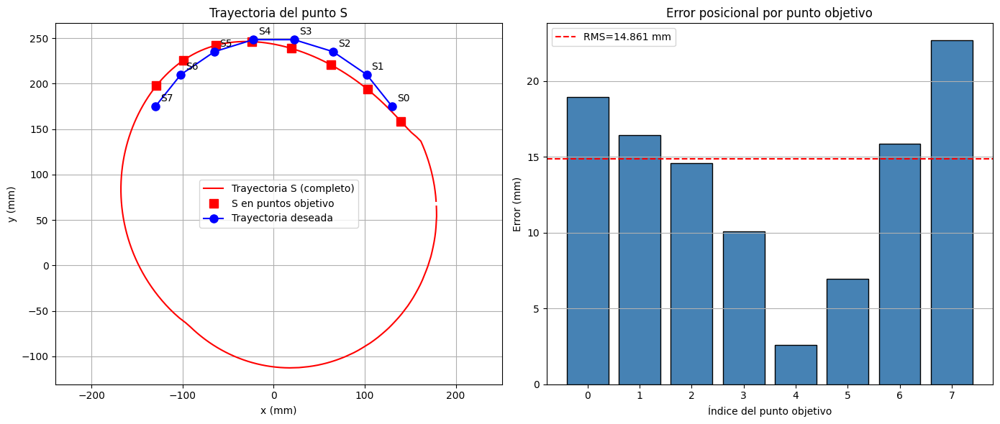

In [275]:
# ============================================================
# GRÁFICA COMPARATIVA: trayectoria deseada vs obtenida
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Panel izquierdo: trayectorias
ax = axes[0]
ax.plot(S_sim[:, 0]*1000, S_sim[:, 1]*1000, 'r-', lw=1.5, label='Trayectoria S (completo)')
ax.plot(S_opt[:, 0]*1000, S_opt[:, 1]*1000, 'rs', ms=8, label='S en puntos objetivo')
ax.plot(SList[:, 0]*1000, SList[:, 1]*1000, 'bo-', ms=8, label='Trayectoria deseada')
for i, (x, y) in enumerate(SList):
    ax.annotate(f'S{i}', (x*1000, y*1000), textcoords='offset points', xytext=(5, 5))
ax.set_xlabel('x (mm)')
ax.set_ylabel('y (mm)')
ax.set_title('Trayectoria del punto S')
ax.legend()
ax.axis('equal')
ax.grid(True)

# Panel derecho: error por punto
ax2 = axes[1]
ax2.bar(range(len(SList)), errors_mm, color='steelblue', edgecolor='k')
ax2.set_xlabel('Índice del punto objetivo')
ax2.set_ylabel('Error (mm)')
ax2.set_title('Error posicional por punto objetivo')
ax2.set_xticks(range(len(SList)))
ax2.grid(True, axis='y')
ax2.axhline(np.sqrt(np.mean(errors_mm**2)), color='r', linestyle='--', label=f'RMS={np.sqrt(np.mean(errors_mm**2)):.3f} mm')
ax2.legend()

plt.tight_layout()
plt.show()

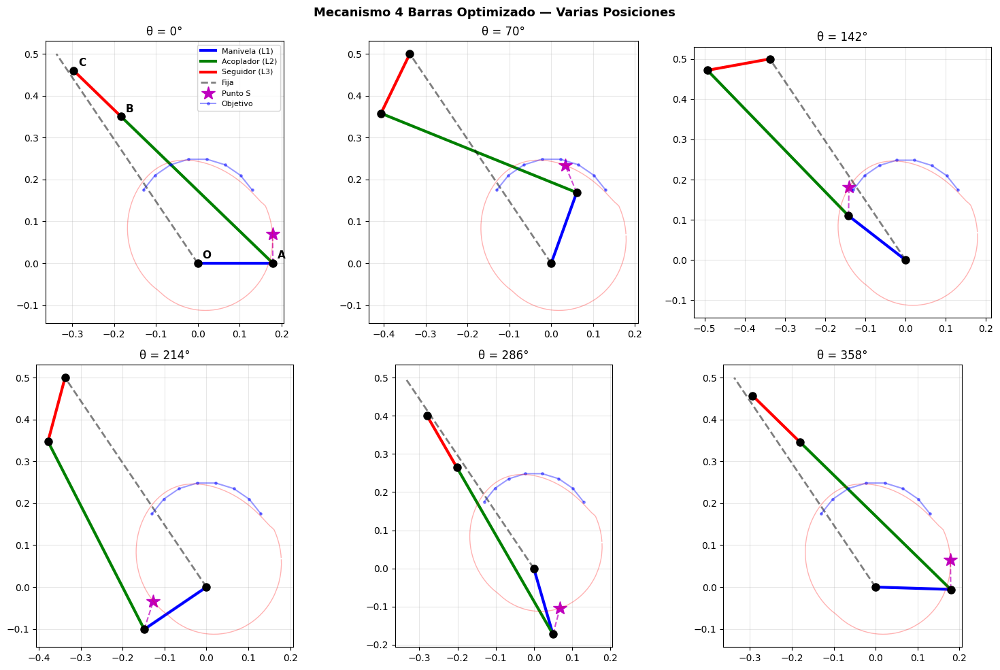

In [276]:
# ============================================================
# FUNCIÓN PARA DIBUJAR EL MECANISMO
# ============================================================
def plot_mechanism(ax, thetas, L1, L2, L3, L4x, L4y, SList=None, show_labels=True):
    """
    Dibuja el mecanismo de 4 barras en el eje dado.
    """
    theta1, beta1, beta2 = thetas
    PO, PA, PB, PC, PS = compute_positions(theta1, beta1, beta2, L1, L2, L3)
    C_fixed = np.array([-L4x, -L4y])  # posición de C en el mundo
    
    # Barra 1: OA (manivela)
    ax.plot([PO[0], PA[0]], [PO[1], PA[1]], 'b-', lw=3, label='Manivela (L1)')
    # Barra 2: AB (acoplador)
    ax.plot([PA[0], PB[0]], [PA[1], PB[1]], 'g-', lw=3, label='Acoplador (L2)')
    # Barra 3: BC (seguidor)
    ax.plot([PB[0], PC[0]], [PB[1], PC[1]], 'r-', lw=3, label='Seguidor (L3)')
    # Barra fija: O-C
    ax.plot([PO[0], C_fixed[0]], [PO[1], C_fixed[1]], 'k--', lw=2, alpha=0.5, label='Fija')
    # Punto S
    ax.plot([PA[0], PS[0]], [PA[1], PS[1]], 'm--', lw=1.5, alpha=0.7)
    ax.plot(PS[0], PS[1], 'm*', ms=15, label='Punto S')
    
    # Pivotes
    for P, label in [(PO, 'O'), (PA, 'A'), (PB, 'B'), (PC, 'C')]:
        ax.plot(P[0], P[1], 'ko', ms=8)
        if show_labels:
            ax.annotate(label, P, textcoords='offset points', xytext=(5, 5), fontsize=11, fontweight='bold')
    
    # Trayectoria deseada
    if SList is not None:
        ax.plot(SList[:, 0], SList[:, 1], 'b.-', ms=5, alpha=0.4, label='Objetivo')
    
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.3)


# Dibujo estático en varias posiciones
n_poses = 6
idx_poses = np.linspace(0, N_sim-1, n_poses, dtype=int)

fig, axes_grid = plt.subplots(2, 3, figsize=(15, 10))
for k, (ax_k, idx) in enumerate(zip(axes_grid.flat, idx_poses)):
    plot_mechanism(ax_k, thetas_sim[idx], L1_opt, L2_opt, L3_opt, L4x_opt, L4y_opt,
                   SList=SList, show_labels=(k == 0))
    ax_k.plot(S_sim[:, 0], S_sim[:, 1], 'r-', lw=1, alpha=0.3)  # traza completa
    ax_k.set_title(f'θ = {rad2deg(thetas_sim[idx, 0]):.0f}°')
    if k == 0:
        ax_k.legend(fontsize=8, loc='upper right')

plt.suptitle('Mecanismo 4 Barras Optimizado — Varias Posiciones', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

In [277]:
# ============================================================
# ANIMACIÓN DEL MECANISMO OPTIMIZADO
# ============================================================
fig_anim, ax_anim = plt.subplots(figsize=(8, 7))

# Calcular límites del gráfico
all_x = np.concatenate([S_sim[:, 0], SList[:, 0], [-L4x_opt]])
all_y = np.concatenate([S_sim[:, 1], SList[:, 1], [-L4y_opt]])
pad = 0.05
xlim = (all_x.min() - pad, all_x.max() + pad)
ylim = (all_y.min() - pad, all_y.max() + pad)

def update_anim(i):
    ax_anim.cla()
    plot_mechanism(ax_anim, thetas_sim[i], L1_opt, L2_opt, L3_opt, L4x_opt, L4y_opt,
                   SList=SList, show_labels=True)
    # Traza recorrida hasta el frame actual
    ax_anim.plot(S_sim[:i+1, 0], S_sim[:i+1, 1], 'r-', lw=2, label='Traza de S')
    ax_anim.set_xlim(xlim)
    ax_anim.set_ylim(ylim)
    ax_anim.set_title(f'Mecanismo 4 Barras Optimizado  —  θ = {rad2deg(thetas_sim[i, 0]):.1f}°')
    ax_anim.legend(fontsize=8, loc='upper right')

anim = FuncAnimation(fig_anim, update_anim, frames=N_sim, interval=30, repeat=True)
plt.close(fig_anim)
HTML(anim.to_jshtml())

## Cinemática Inversa (IK)

Dado un punto objetivo para S, encuentra el ángulo de entrada θ y los ángulos dependientes β₁, β₂.

In [278]:
# ============================================================
# CINEMÁTICA INVERSA
# ============================================================
def IK(target_pos, theta1_ig, z0_init,
       L1, L2, L3, L4x, L4y):
    """
    Cinemática Inversa: dado un punto objetivo para S,
    encuentra [theta1, beta1, beta2].
    
    Parámetros
    ----------
    target_pos  : array [x, y] - posición objetivo de S (m)
    theta1_ig   : float - estimación inicial de theta1 (rad)
    z0_init     : list [beta1, beta2] - estimación inicial (rad)
    L1..L4y     : float - dimensiones del mecanismo (m) [usar los óptimos]
    
    Retorna
    -------
    thetas : array [theta1, beta1, beta2]
    error  : float - distancia entre S calculado y objetivo (m)
    sol    : resultado completo del optimizador
    """
    target_pos = np.asarray(target_pos, dtype=float)
    z0 = list(z0_init)
    
    def objective(theta1_arr):
        theta1_val = float(theta1_arr[0])
        # CORRECTO: usar los valores numéricos óptimos, no variables simbólicas
        z, res = FK(theta1_val, z0, L1, L2, L3, L4x, L4y)
        if res > 1e-5:
            return 1e6
        S_calc = point_S(theta1_val, z[0], L1)
        return float(np.sum((S_calc - target_pos)**2))
    
    sol = minimize(
        objective,
        x0=np.array([theta1_ig]),
        method='Nelder-Mead',
        options={'xatol': 1e-8, 'fatol': 1e-12, 'maxiter': 2000}
    )
    
    theta1_opt = float(sol.x[0])
    z_opt, _ = FK(theta1_opt, z0, L1, L2, L3, L4x, L4y)
    S_final = point_S(theta1_opt, z_opt[0], L1)
    error = float(np.linalg.norm(S_final - target_pos))
    
    thetas = np.array([theta1_opt, z_opt[0], z_opt[1]])
    return thetas, error, sol


# Ejemplo: IK para el primer punto objetivo
target = SList[0]
thetas_ik, error_ik, sol_ik = IK(
    target_pos=target,
    theta1_ig=theta_opt_list[0],
    z0_init=[deg2rad(120), deg2rad(-80)],
    L1=L1_opt, L2=L2_opt, L3=L3_opt, L4x=L4x_opt, L4y=L4y_opt
)

print(f"Objetivo:  S = ({target[0]*1000:.2f}, {target[1]*1000:.2f}) mm")
print(f"Solución:  θ={rad2deg(thetas_ik[0]):.2f}°, β₁={rad2deg(thetas_ik[1]):.2f}°, β₂={rad2deg(thetas_ik[2]):.2f}°")

S_check = point_S(thetas_ik[0], thetas_ik[1], L1_opt)
print(f"S obtenido: ({S_check[0]*1000:.2f}, {S_check[1]*1000:.2f}) mm")
print(f"Error IK:   {error_ik*1000:.4f} mm")

TypeError: loop of ufunc does not support argument 0 of type Float which has no callable sqrt method

In [ ]:
# ============================================================
# RESUMEN FINAL
# ============================================================
print("="*60)
print("RESUMEN DE LA OPTIMIZACIÓN")
print("="*60)
print(f"\nDimensiones optimizadas:")
print(f"  L1 (manivela):   {L1_opt*1000:8.2f} mm")
print(f"  L2 (acoplador):  {L2_opt*1000:8.2f} mm")
print(f"  L3 (seguidor):   {L3_opt*1000:8.2f} mm")
print(f"  L4x (fijo x):    {L4x_opt*1000:8.2f} mm")
print(f"  L4y (fijo y):    {L4y_opt*1000:8.2f} mm")
print(f"  C posición:      ({-L4x_opt*1000:.1f}, {-L4y_opt*1000:.1f}) mm")
print(f"\nPoint S offset (fijo):")
print(f"  L5t (tangencial): {L5t*1000:.1f} mm")
print(f"  L5n (normal):     {L5n*1000:.1f} mm")
print(f"\nCalidad de la solución:")
print(f"  Error RMS:   {np.sqrt(np.mean(errors_mm**2)):.4f} mm")
print(f"  Error máx:   {errors_mm.max():.4f} mm")
print(f"  Error mín:   {errors_mm.min():.4f} mm")
print(f"  Convergencia FK: {converged_sim.sum()}/{N_sim} pasos")

RESUMEN DE LA OPTIMIZACIÓN

Dimensiones optimizadas:
  L1 (manivela):      34.27 mm
  L2 (acoplador):  654551.58 mm
  L3 (seguidor):   654684.15 mm
  L4x (fijo x):     -189.71 mm
  L4y (fijo y):        9.61 mm
  C posición:      (189.7, -9.6) mm

Point S offset (fijo):
  L5t (tangencial): 50.0 mm
  L5n (normal):     -50.0 mm

Calidad de la solución:
  Error RMS:   169.8875 mm
  Error máx:   197.8600 mm
  Error mín:   135.8085 mm
  Convergencia FK: 200/200 pasos
